In [2]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import seaborn as sns
import os
sns.set_theme()

In [3]:
clubb_dir='/home/tsw35/soteria/clubb'
conv_dir = clubb_dir+'/conv_100v2/'

In [4]:
#### CHECK IT CHECK IT ####
s=0
e=-1
checkdir = '/home/tsw35/soteria/clubb/convi_1/k_1/c_1/'
#checkdir= '/home/tsw35/soteria/software/CLUBB/'
fp = nc.Dataset(checkdir+'output/arm_sfc.nc','r')
for f in fp.variables:
    plt.figure()
    if f in ['altitude','longitude','latitude','time']:
        continue
    print(f)
    plt.plot(fp['time'][s:e],fp[f][s:e,0,0,0],color='blue',linewidth=2)
    plt.title(f)

FileNotFoundError: [Errno 2] No such file or directory: b'/home/tsw35/soteria/clubb/convi_1/k_1/c_1/output/arm_sfc.nc'

In [5]:
#### CHECK SIMILARITY ####
s=250
e=750
fp1 = nc.Dataset(conv_dir+'k_1/c_1/output/arm_sfc.nc','r')
fp1a = nc.Dataset(conv_dir+'k_1/agg_outsfc.nc','r')
print(np.sum(fp1['lwp'][:,0,0,0]-fp1a['lwp'][:,0,0,0]))
plt.plot(fp1['time'][:],fp1['lwp'][:,0,0,0])
plt.plot(fp1a['time'][:],fp1a['lwp'][:,0,0,0])

FileNotFoundError: [Errno 2] No such file or directory: b'/home/tsw35/soteria/clubb/conv_100v2/k_1/c_1/output/arm_sfc.nc'

sgp_201745 -4.33490072998065 -0.09821727093826078
sgp_2016716 -1.5692263359272616 -0.6190966826218393
sgp_2016611 0.2846207665489903 -0.28229857071692455
sgp_2017630 -2.2534020109325 -2.8136746302234967
sgp_2016518 -2.4627135495080097 -1.3760771677436199
sgp_2017716 -0.16453215379268404 0.39974847471909003
sgp_2016819 -0.5607114941327016 -2.1069804002444132
sgp_2017629 -1.1905262810690516 -2.5201821526575428
sgp_201769 -0.9936726119212433 0.7047837889355789
sgp_2017826 -0.6561742669414659 -0.7171017954758176
sgp_2017828 -2.434221598427288 1.9659523225532454
sgp_201774 -1.0978753340230305 -0.18918858145414683
sgp_2016530 -0.24448187317512887 -1.1219307966224525
sgp_2017524 -5.192282782963095 4.293565376319919
sgp_2017627 -1.8201740165020914 0.025739966128008693
sgp_2017720 0.6700725447454647 -0.47999788309308267
sgp_2017712 1.0157091714335884 -0.5780969726852956
sgp_201779 -0.9240195621368429 0.7610965550443867
sgp_2017922 0.2862987035490583 -1.1119753432222321
sgp_2016720 0.40468505307

<BarContainer object of 40 artists>

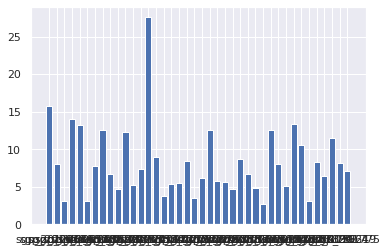

In [6]:
us = []
sgp = []
vs = []
uu = []
for file in os.listdir(clubb_dir):
    try:
        fp1 = nc.Dataset(clubb_dir+'/'+file+'/k_1/agg_outsfc.nc','r')
        fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/agg_outsfc.nc','r')
        fp2_1 = nc.Dataset(clubb_dir+'/'+file+'/k_2/c_1/output/arm_sfc.nc','r')  
        fp2_2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/c_2/output/arm_sfc.nc','r')
        fp_50 = nc.Dataset(clubb_dir+'/'+file+'/k_50/agg_outsfc.nc','r')
    except:
        if 'sgp' in file:
            pass
        continue
    if 'sgp' not in file:
        continue
    fp = nc.Dataset(clubb_dir+'/'+file+'/k_1/c_1/output/arm_zt.nc','r')
    us.append(np.mean(fp['um'][:]))
    vs.append(np.mean(fp['vm'][:]))
    sgp.append(file)
    uu.append(np.mean(np.sqrt(fp['um'][:]**2+fp['vm'][:]**2)))
    print(file+' '+str(us[-1])+' '+str(vs[-1]))
plt.bar(sgp,uu)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39],
 <a list of 40 Text xticklabel objects>)

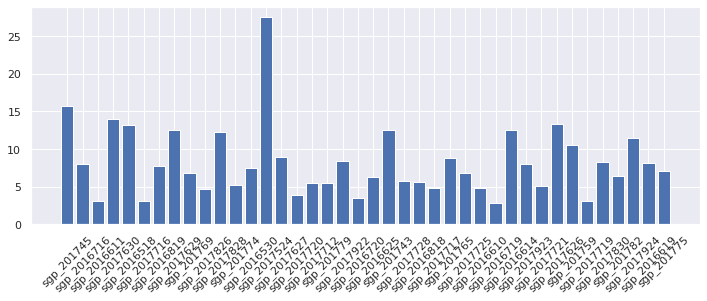

In [7]:
plt.figure(figsize=(12,4))
plt.bar(sgp,uu)
plt.xticks(rotation=45)

In [251]:

fp1 = nc.Dataset(clubb_dir+'/convi1c_0/k_1/agg_outsfc.nc','r')
fp2 = nc.Dataset(clubb_dir+'/convi1c_0/k_2/agg_outsfc.nc','r')
fp2_1 = nc.Dataset(clubb_dir+'/convi1c_0/k_2/c_1/output/arm_sfc.nc','r')
fp2_2 = nc.Dataset(clubb_dir+'/convi1c_0/k_2/c_2/output/arm_sfc.nc','r')

FileNotFoundError: [Errno 2] No such file or directory: b'/home/tsw35/soteria/clubb/convi1c_0/k_1/agg_outsfc.nc'

In [4]:
# ------------------- #
# PLOT THE DIFFERENCE #
# ------------------- #
s=250
e=750
plt.figure(figsize=(10,8))
plt.plot(fp1['time'][s:e],fp1['lwp'][s:e,0,0,0],color='blue',linewidth=2)
plt.plot(fp2['time'][s:e],fp2['lwp'][s:e,0,0,0],color='red',linewidth=2)
plt.plot(fp2_1['time'][s:e],fp2_1['lwp'][s:e,0,0,0],color='lightcoral',alpha=.3)
plt.plot(fp2_2['time'][s:e],fp2_2['lwp'][s:e,0,0,0],color='orange',alpha=.3)
plt.legend(['Single Column','Aggregated 2 Column','Column 1','Column 2'])
plt.title('Compare Liquid Water Path')
plt.xlabel('Time (seconds)')
plt.ylabel('LWP')

NameError: name 'fp1' is not defined

<Figure size 720x576 with 0 Axes>

In [ ]:
i=0
for file in os.listdir(clubb_dir):
    if 'sgp' in file:
        i = i+1
print(i)

sgp_2017527


/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

sgp_2017614


/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

sgp_2016830
40


/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


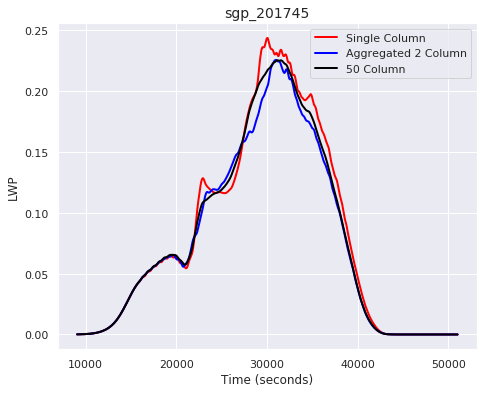

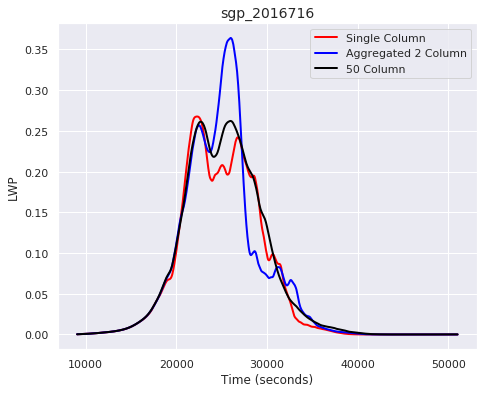

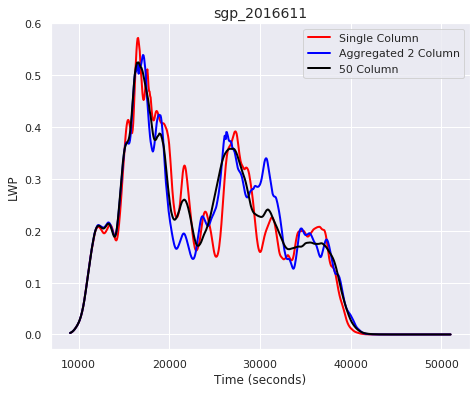

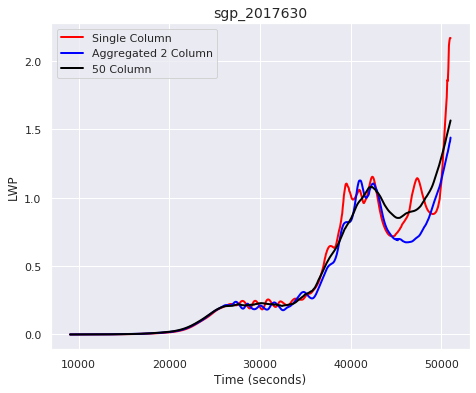

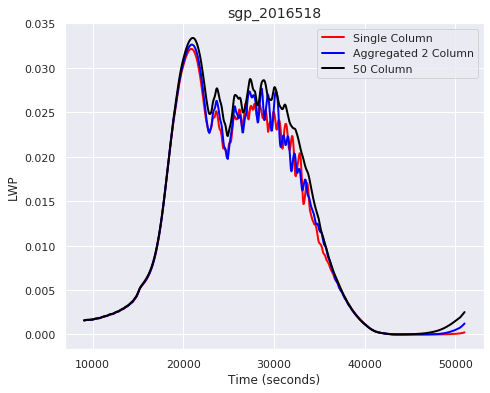

...

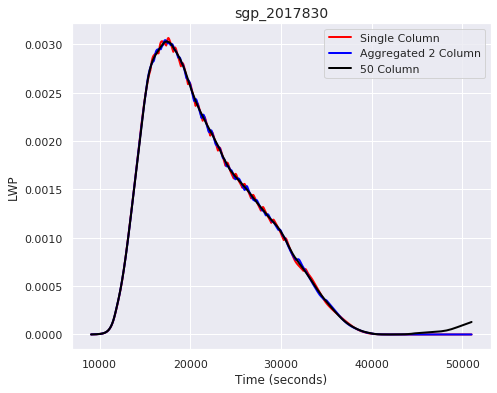

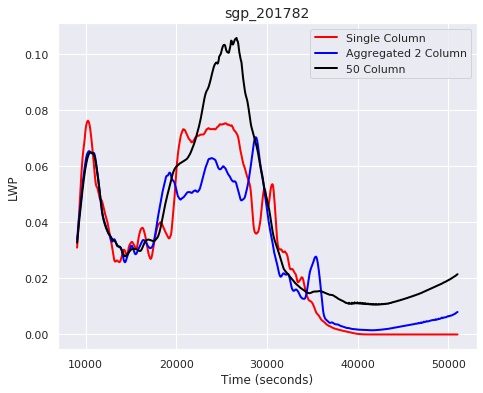

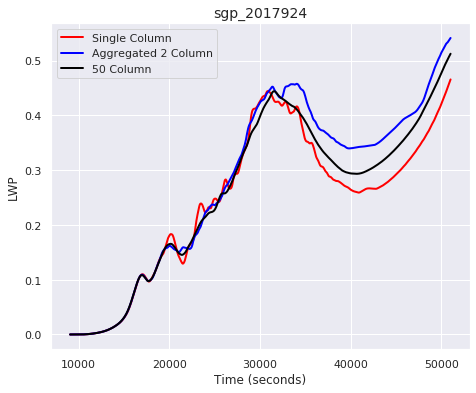

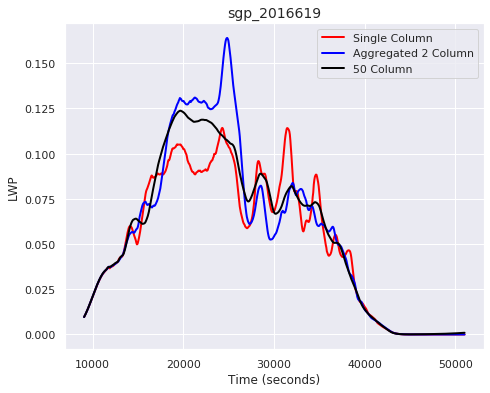

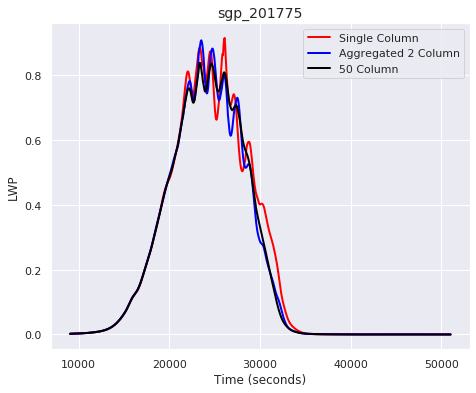

In [5]:
# Plot the Difference for ALL
i = 0
badfiles=[]
for file in os.listdir(clubb_dir):
    try:
        fp1 = nc.Dataset(clubb_dir+'/'+file+'/k_1/agg_outsfc.nc','r')
        fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/agg_outsfc.nc','r')
        fp2_1 = nc.Dataset(clubb_dir+'/'+file+'/k_2/c_1/output/arm_sfc.nc','r')  
        fp2_2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/c_2/output/arm_sfc.nc','r')
        fp_50 = nc.Dataset(clubb_dir+'/'+file+'/k_50/agg_outsfc.nc','r')
    except:
        if 'sgp' in file:
            print(file)
            badfiles.append(file)
        continue
    if 'sgp' not in file:
        continue
    s=150
    e=850
    i=i+1
    plt.figure(figsize=(7.5,6))
    plt.plot(fp1['time'][s:e],fp1['lwp'][s:e,0,0,0],color='red',linewidth=2)
    plt.plot(fp2['time'][s:e],fp2['lwp'][s:e,0,0,0],color='blue',linewidth=2)
    plt.plot(fp2['time'][s:e],fp_50['lwp'][s:e,0,0,0],color='black',linewidth=2)
    #plt.plot(fp2_1['time'][s:e],fp2_1['lwp'][s:e,0,0,0],color='darkblue',alpha=.3)
    #plt.plot(fp2_2['time'][s:e],fp2_2['lwp'][s:e,0,0,0],color='cyan',alpha=.3)
    plt.legend(['Single Column','Aggregated 2 Column','50 Column','C_1','C_2'])
    plt.title(file,fontsize=14)
    plt.xlabel('Time (seconds)')
    plt.ylabel('LWP')
print(i)

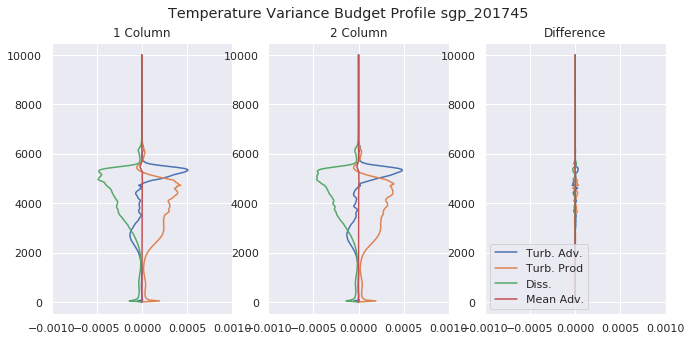

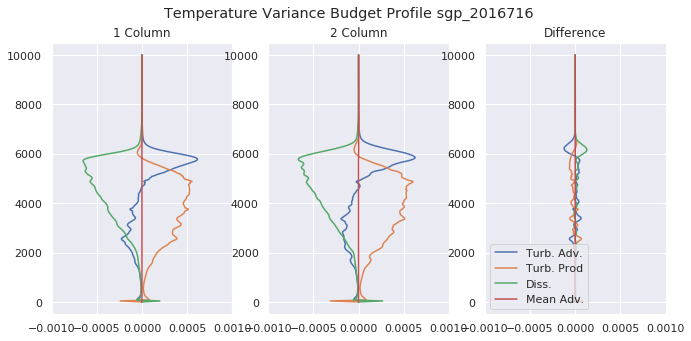

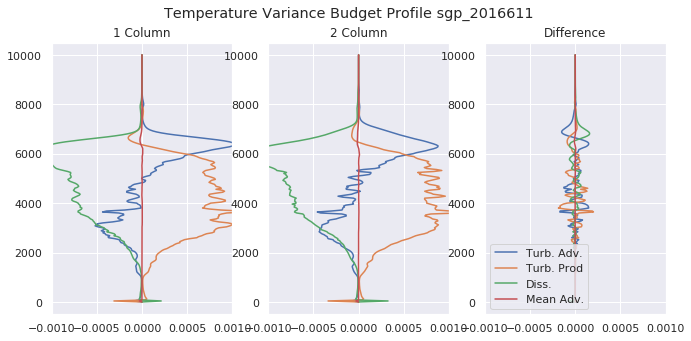

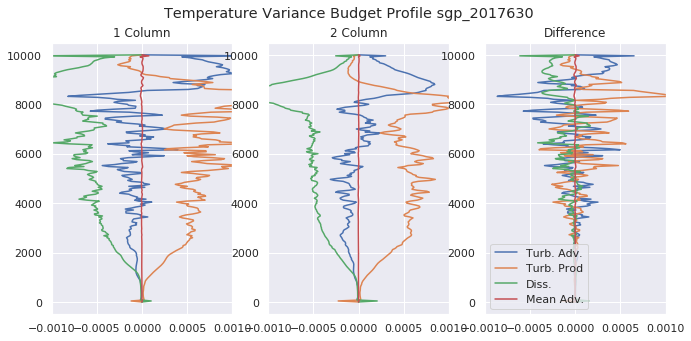

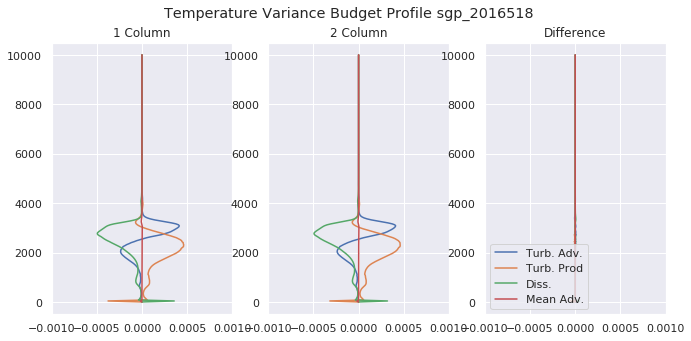

...

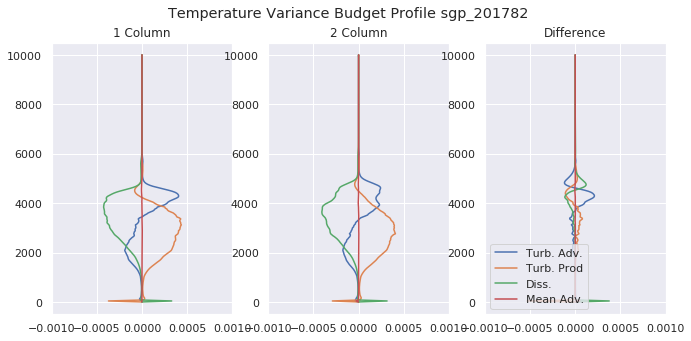

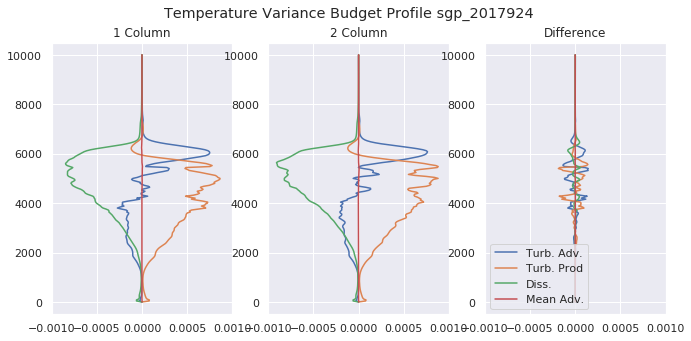

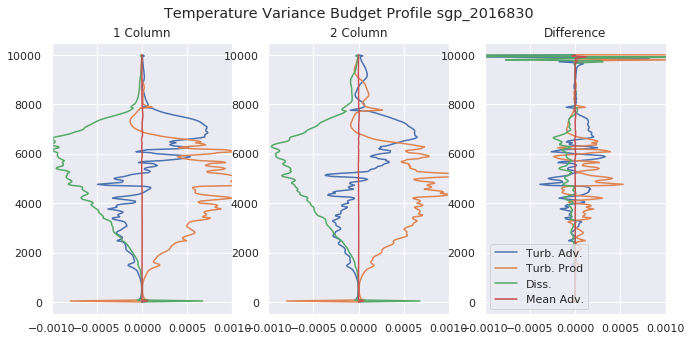

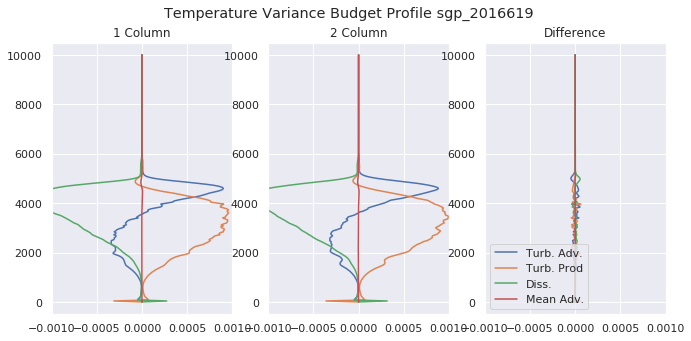

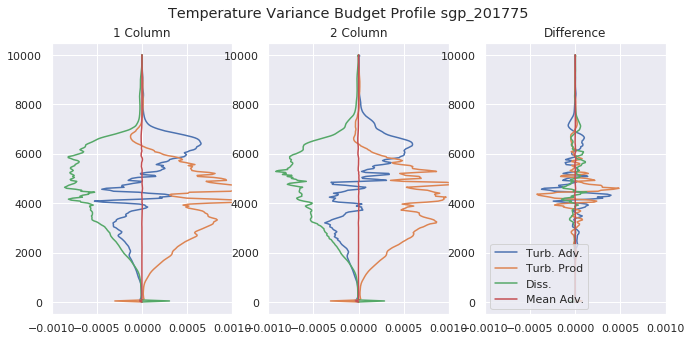

In [8]:
import warnings
warnings.filterwarnings('ignore')
filelist = os.listdir(clubb_dir)
for file in filelist:
    try:
        fp1 = nc.Dataset(clubb_dir+'/'+file+'/k_1/agg_outzm.nc','r')
        fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/agg_outzm.nc','r')
    except:
        continue
    if 'sgp' not in file:
        continue
    tindex=7
    fig=plt.figure(figsize=(11,5))
    for i in range(2):
        if i == 2:
            i = 49
        fp = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(i+1)+'/agg_outzm.nc','r')
        plt.subplot(1,3,i+1)
        alt      = fp['altitude'][:]
        thlp2_ta = np.mean(fp['thlp2_ta'][:,:,0,0],axis=0)
        thlp2_tp = np.mean(fp['thlp2_tp'][:,:,0,0],axis=0)
        thlp2_dp = np.mean(fp['thlp2_dp1'][:,:,0,0],axis=0)+np.mean(fp['thlp2_dp2'][:,:,0,0],axis=0)
        thlp2_ma = np.mean(fp['thlp2_ma'][:,:,0,0],axis=0)
        thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
        plt.plot(thlp2_ta,alt)
        plt.plot(thlp2_tp,alt)
        plt.plot(thlp2_dp,alt)
        plt.plot(thlp2_ma,alt)
        plt.xlim(-0.001,0.001)
        plt.title(str(i+1)+' Column')
    fp = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(1)+'/agg_outzm.nc','r')
    plt.subplot(1,3,3)
    thlp2_ta = np.mean(fp['thlp2_ta'][:,:,0,0],axis=0)
    thlp2_tp = np.mean(fp['thlp2_tp'][:,:,0,0],axis=0)
    thlp2_dp = np.mean(fp['thlp2_dp1'][:,:,0,0],axis=0)+np.mean(fp['thlp2_dp2'][:,:,0,0],axis=0)
    thlp2_ma = np.mean(fp['thlp2_ma'][:,:,0,0],axis=0)
    thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
    fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(50)+'/agg_outzm.nc','r')
    thlp2_ta = (thlp2_ta - np.mean(fp2['thlp2_ta'][:,:,0,0],axis=0))
    thlp2_tp = (thlp2_tp - np.mean(fp2['thlp2_tp'][:,:,0,0],axis=0))
    thlp2_dp = (thlp2_dp - (np.mean(fp2['thlp2_dp1'][:,:,0,0],axis=0)+np.mean(fp2['thlp2_dp2'][:,:,0,0],axis=0)))
    thlp2_ma = (thlp2_ma - np.mean(fp2['thlp2_ma'][:,:,0,0],axis=0))
    plt.plot(thlp2_ta,alt)
    plt.plot(thlp2_tp,alt)
    plt.plot(thlp2_dp,alt)
    plt.plot(thlp2_ma,alt)
    plt.xlim(-0.001,0.001)
    plt.legend(['Turb. Adv.','Turb. Prod','Diss.','Mean Adv.'],loc='lower left')
    plt.title('Difference')
    plt.suptitle('Temperature Variance Budget Profile '+str(file))

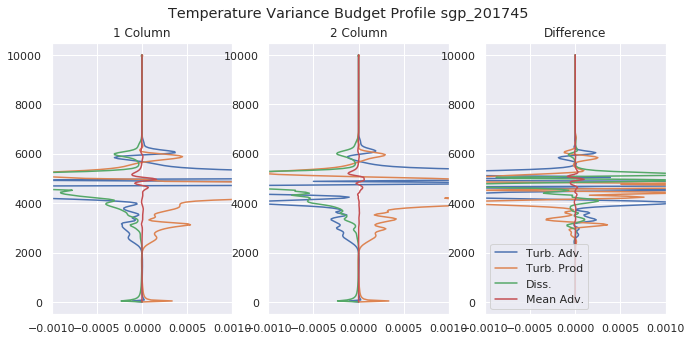

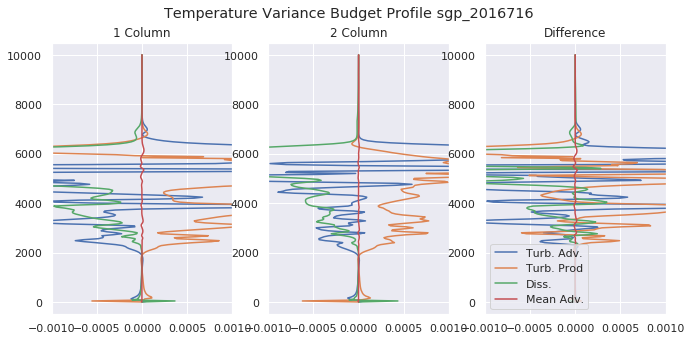

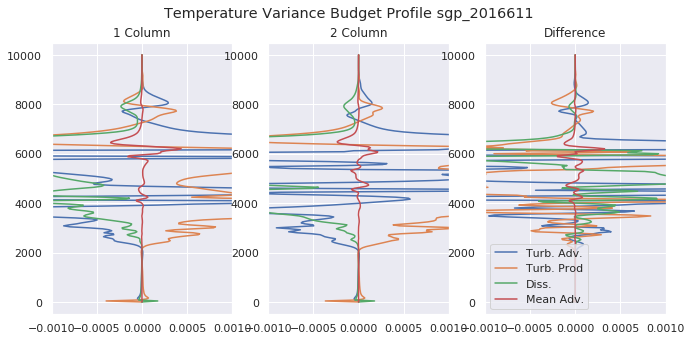

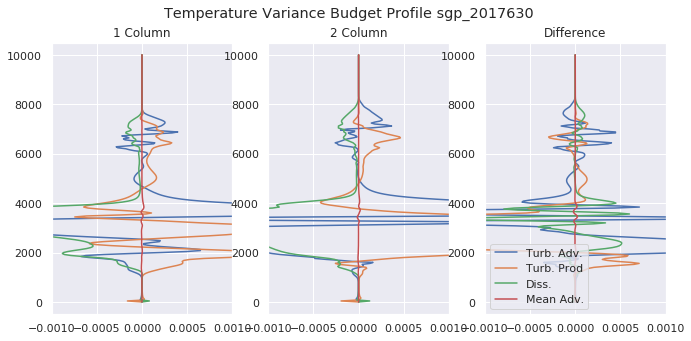

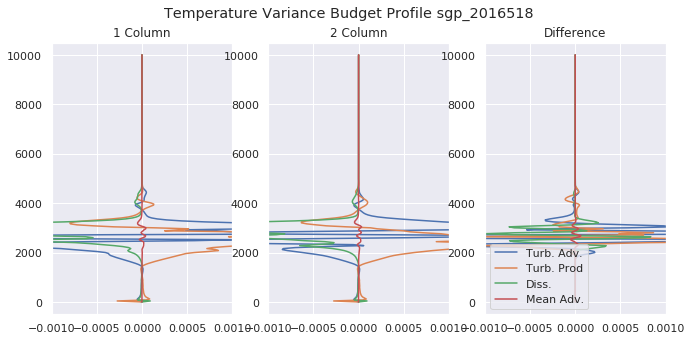

...

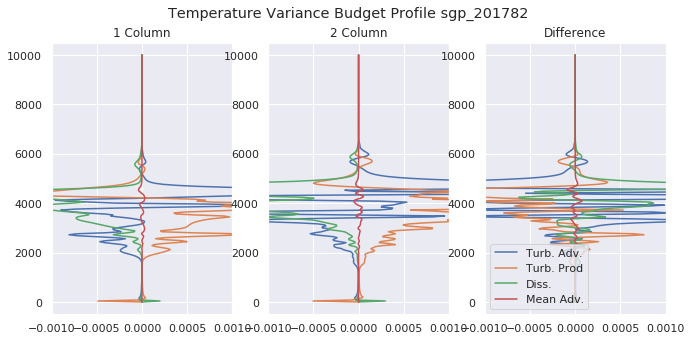

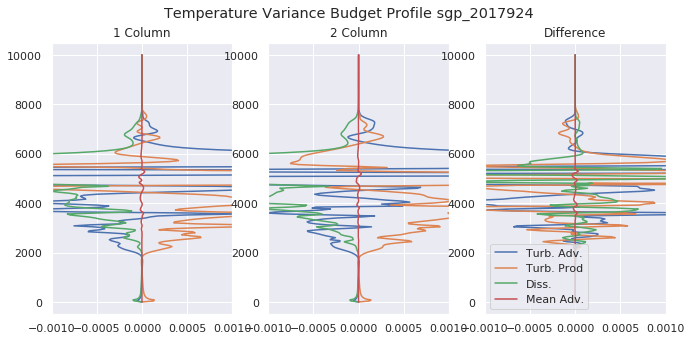

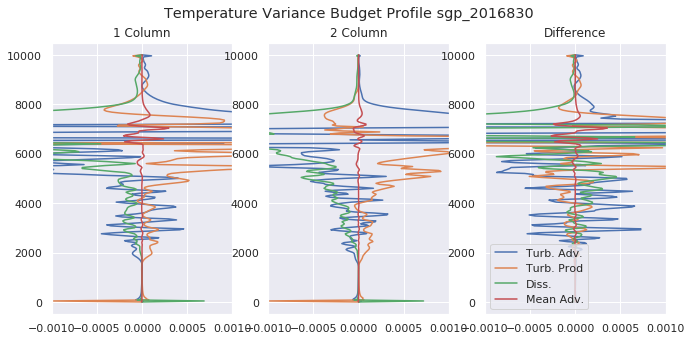

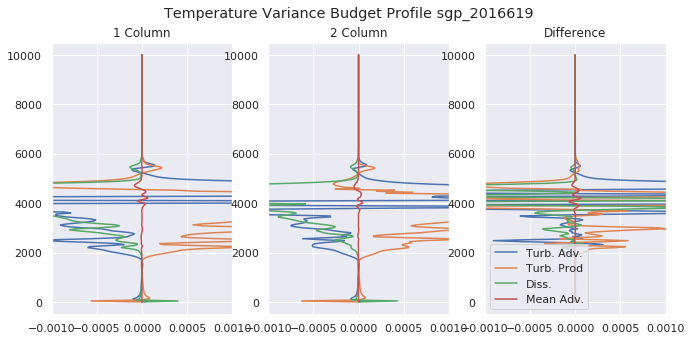

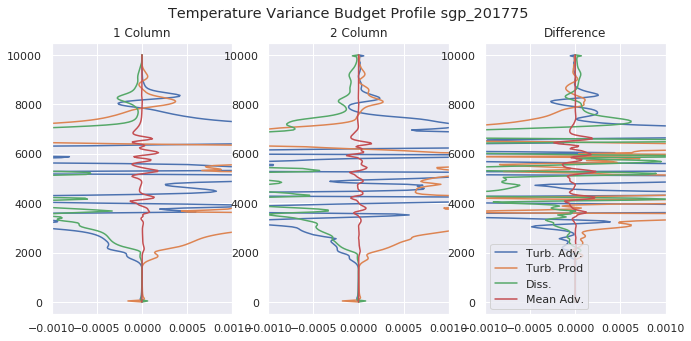

In [9]:
import warnings
ti = 500
warnings.filterwarnings('ignore')
for file in os.listdir(clubb_dir):
    try:
        fp1 = nc.Dataset(clubb_dir+'/'+file+'/k_1/agg_outzm.nc','r')
        fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_2/agg_outzm.nc','r')
    except:
        continue
    if 'sgp' not in file:
        continue
    tindex=7
    fig=plt.figure(figsize=(11,5))
    for i in range(2):
        fp = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(i+1)+'/agg_outzm.nc','r')
        plt.subplot(1,3,i+1)
        alt      = fp['altitude'][:]
        try:
            thlp2_ta = fp['thlp2_ta'][ti,:,0,0]
        except:
            continue
        thlp2_tp = fp['thlp2_tp'][ti,:,0,0]
        thlp2_dp = fp['thlp2_dp1'][ti,:,0,0] + fp['thlp2_dp2'][ti,:,0,0]
        thlp2_ma = fp['thlp2_ma'][ti,:,0,0]
        thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
        plt.plot(thlp2_ta,alt)
        plt.plot(thlp2_tp,alt)
        plt.plot(thlp2_dp,alt)
        plt.plot(thlp2_ma,alt)
        plt.xlim(-0.001,0.001)
        plt.title(str(i+1)+' Column')
    fp = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(1)+'/agg_outzm.nc','r')
    try:
        thlp2_ta = fp['thlp2_ta'][ti,:,0,0]
    except:
        continue
    plt.subplot(1,3,3)
    thlp2_ta = fp['thlp2_ta'][ti,:,0,0]
    thlp2_tp = fp['thlp2_tp'][ti,:,0,0]
    thlp2_dp = fp['thlp2_dp1'][ti,:,0,0] + fp['thlp2_dp2'][ti,:,0,0]
    thlp2_ma = fp['thlp2_ma'][ti,:,0,0]
    thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
    fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(2)+'/agg_outzm.nc','r')
    try:
        thlp2_ta9 = fp2['thlp2_ta'][9,:,0,0]
    except:
        continue
    thlp2_ta = (thlp2_ta - fp2['thlp2_ta'][ti,:,0,0])
    thlp2_tp = (thlp2_tp - fp2['thlp2_tp'][ti,:,0,0])
    thlp2_dp = (thlp2_dp - (fp2['thlp2_dp1'][ti,:,0,0]+fp2['thlp2_dp2'][ti,:,0,0]))
    thlp2_ma = (thlp2_ma - fp2['thlp2_ma'][ti,:,0,0])
    plt.plot(thlp2_ta,alt)
    plt.plot(thlp2_tp,alt)
    plt.plot(thlp2_dp,alt)
    plt.plot(thlp2_ma,alt)
    plt.xlim(-0.001,0.001)
    plt.legend(['Turb. Adv.','Turb. Prod','Diss.','Mean Adv.'],loc='lower left')
    plt.title('Difference')
    plt.suptitle('Temperature Variance Budget Profile '+str(file))

In [ ]:
conv_dir1 = clubb_dir+'/t2_1/'
conv_dir2 = clubb_dir+'/t2_2/'

fp20 = nc.Dataset(conv_dir+'k_2/agg_outsfc.nc','r')
fp21 = nc.Dataset(conv_dir1+'k_2/agg_outsfc.nc','r')
fp22 = nc.Dataset(conv_dir2+'k_2/agg_outsfc.nc','r')

In [ ]:
s=250
e=750
plt.figure(figsize=(10,8))
for i in range(10):
    cdir = clubb_dir+'/convi_'+str(i)+'/'
    fp = nc.Dataset(cdir+'k_2/agg_outsfc.nc','r')
    plt.plot(fp1['time'][s:e],fp['lwp'][s:e,0,0,0])

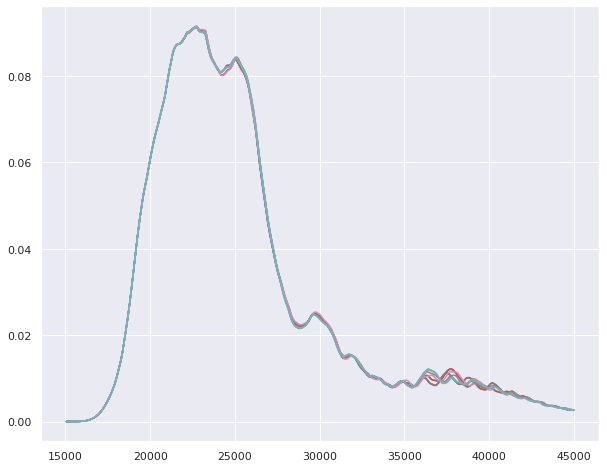

In [283]:
plt.figure(figsize=(10,8))
for i in range(10):
    cdir = clubb_dir+'/convi1c_'+str(i)+'/'
    fp = nc.Dataset(cdir+'k_2/agg_outsfc.nc','r')
    plt.plot(fp1['time'][s:e],fp['lwp'][s:e,0,0,0])

In [284]:
pcrts = []
for i in range(10):
    cdir = clubb_dir+'/convi1c_'+str(i)+'/'
    fpi = nc.Dataset(cdir+'k_2/clusters.nc','r')
    for j in range(10):
        if j == i:
            continue
        cdir2 = clubb_dir+'/convi1c_'+str(j)+'/'
        fpj = nc.Dataset(cdir2+'k_2/clusters.nc','r')
        a = np.sum(fpi['cluster'][tindex,:,:]!=fpj['cluster'][tindex,:,:])
        b = fpi['cluster'][tindex,:,:].size
        pcrt = a/b*100
        if pcrt >50:
            pcrt=100-pcrt
        print(pcrt)
        pcrts.append(pcrt)
print()
print(np.mean(pcrts))

0.0287
0.0075
0.0068
0.0017
0.002300000000005298
0.0063
0.0278
0.030600000000000002
0.03119999999999834
0.0287
0.0212
0.021900000000000003
0.027
0.03100000000000591
0.034999999999999996
0.0009
0.0019000000000000002
0.002500000000011937
0.0075
0.0212
0.0007
0.0058
0.009799999999998477
0.0138
0.0203
0.0231
0.02370000000000516
0.0068
0.021900000000000003
0.0007
0.0051
0.00909999999998945
0.0131
0.021
0.0238
0.024399999999999977
0.0017
0.027
0.0058
0.0051
0.0040000000000048885
0.008
0.0261
0.0289
0.02949999999999875
0.002300000000005298
0.03100000000000591
0.009799999999998477
0.00909999999998945
0.0040000000000048885
0.0040000000000048885
0.030100000000004457
0.03289999999999793
0.0335
0.0063
0.034999999999999996
0.0138
0.0131
0.008
0.0040000000000048885
0.0341
0.0369
0.037499999999994316
0.0278
0.0009
0.0203
0.021
0.0261
0.030100000000004457
0.0341
0.0028
0.0033999999999991815
0.030600000000000002
0.0019000000000000002
0.0231
0.0238
0.0289
0.03289999999999793
0.0369
0.0028
0.000599999999

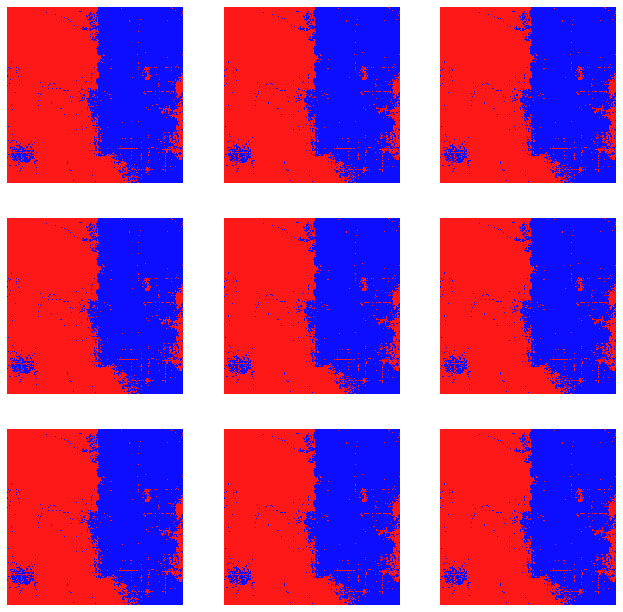

In [288]:
#### Show the Clusters for a timestep ####
from matplotlib import colors
tindex=7
fig=plt.figure(figsize=(11,11))
for i in range(9):
    cdir = clubb_dir+'/convi1c_'+str(i)+'/'
    plt.subplot(3,3,i+1)
    fp = nc.Dataset(cdir+'k_2/clusters.nc','r')
    clust=fp['cluster'][tindex,:,:]
    mheat=[]
    H = fp['H'][tindex,:,:]
    nmax=np.max(clust)
    for j in range(int(nmax+1)):
        mheat.append(np.mean(fp['H'][tindex,:,:][clust==j]))
        clust[clust==j]=mheat[j]
    plt.imshow(clust,cmap='seismic',vmin=np.percentile(H,1),vmax=np.percentile(H,99))
    plt.grid(False)
    plt.axis('off')

In [153]:
#### Make list of numbers ####
conv_dir=clubb_dir+'/sgp_2017716/'
ks = []
for file in os.listdir(conv_dir):
    ks.append(int(file[2:]))
ks.sort()

In [1]:
#### Show LWP Convergence ####
import matplotlib as mpl

norm = mpl.colors.Normalize(vmin=1, vmax=50)

s = 150
e = 850
num = 50#len(ks)
#colors=['black','navy','darkslateblue','mediumblue','mediumslateblue','cornflowerblue','deepskyblue','lightskyblue','paleturquoise','lightcyan']
colors=plt.cm.terrain(np.linspace(0,1,num))
colors[0]=[1,0,0,1]
legk = []
fig, ax= plt.subplots(figsize=(7.5,6))
for i in range(num):
    if i>=len(ks):
        continue
    j = ks[i]
    fp = nc.Dataset(conv_dir+'k_'+str(j)+'/agg_outsfc.nc','r')
    plt.plot(fp['time'][s:e],fp['lwp'][s:e,0,0,0],color=colors[j-1])
    legk.append('k = '+str(j))
plt.title('Comparing Results for Different Numbers of Clusters')
plt.xlabel('Time (seconds)')
plt.ylabel('LWP')
plt.legend(['k = 1'])
fig, ax= plt.subplots(figsize=(.3,6))
cb1 = mpl.colorbar.ColorbarBase(ax,norm=norm,cmap=plt.cm.terrain)
cb1.set_label('Number of Clusters')

NameError: name 'plt' is not defined

Text(0, 0.5, 'Time of Peak (minutes)')

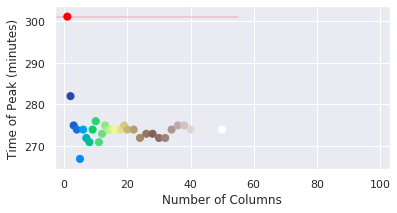

In [155]:
plt.figure(figsize=(6,3))
peakval = []
peakind = []
peaktime = []
js = []
colors=plt.cm.terrain(np.linspace(0,1,len(ks)))
colors[0]=[1,0,0,1]
for i in range(len(ks)):
    j = ks[i]
    js.append(j)
    fp = nc.Dataset(conv_dir+'k_'+str(j)+'/agg_outsfc.nc','r')
    peakind.append(np.argmax(fp['lwp'][:,0,0,0]))
    peakval.append(fp['lwp'][peakind[-1],0,0,0])
    peaktime.append(fp['time'][peakind[-1]]/60)
plt.plot([js[0]-5,js[-1]+5],[peaktime[0],peaktime[0]],color='red',alpha = .2)
plt.scatter(js,peaktime,c=colors,s=50)
plt.xlim(-3,103)
plt.xlabel('Number of Columns')
plt.ylabel('Time of Peak (minutes)')

(-3, 103)

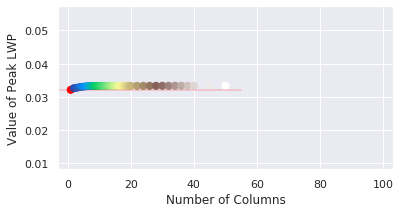

In [151]:
plt.figure(figsize=(6,3))
plt.scatter(js,peakval,c=colors,s=50)
plt.plot([js[0]-5,js[-1]+5],[peakval[0],peakval[0]],color='red',alpha = .2)
plt.xlabel('Number of Columns')
plt.ylabel('Value of Peak LWP')
plt.xlim(-3,103)

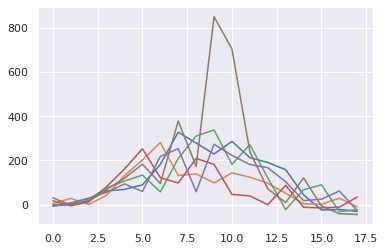

In [275]:
cselect=5
fp = nc.Dataset(conv_dir+'k_'+str(cselect)+'/agg_outsfc.nc','r')
fpc = nc.Dataset(conv_dir+'k_'+str(j)+'/clusters.nc','r')
for i in range(cselect+1):
    H = []
    for t in range(len(fpc['H'][:,0,0])):
        H.append(np.mean(fpc['H'][t,:,:][fpc['cluster'][t,:,:]==i]))
    plt.plot(H)
    

In [206]:
print(colors[0])

[0.2 0.2 0.6 1. ]


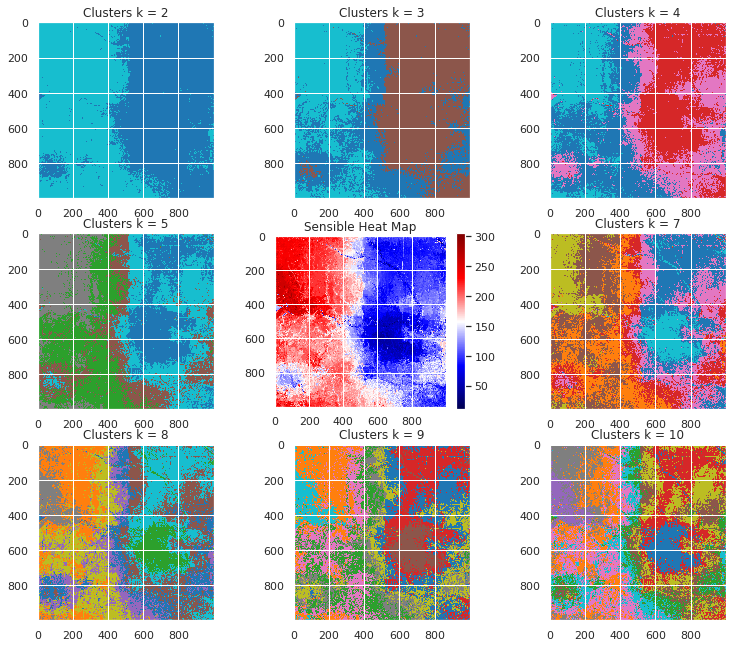

In [155]:
#### Show the Clusters for a timestep ####
tindex=5
fig=plt.figure(figsize=(13,11))
for i in range(9):
    plt.subplot(3,3,i+1)
    if i == 4:
        fp = nc.Dataset(conv_dir+'k_1/clusters.nc','r')
        plt.imshow(fp['H'][tindex,:,:],cmap='seismic')
        plt.colorbar()
        plt.title('Sensible Heat Map')
    else:
        fp = nc.Dataset(conv_dir+'k_'+str(i+2)+'/clusters.nc','r')
        plt.imshow(fp['cluster'][tindex,:,:],cmap='tab10')
        plt.title('Clusters k = '+str(i+2))

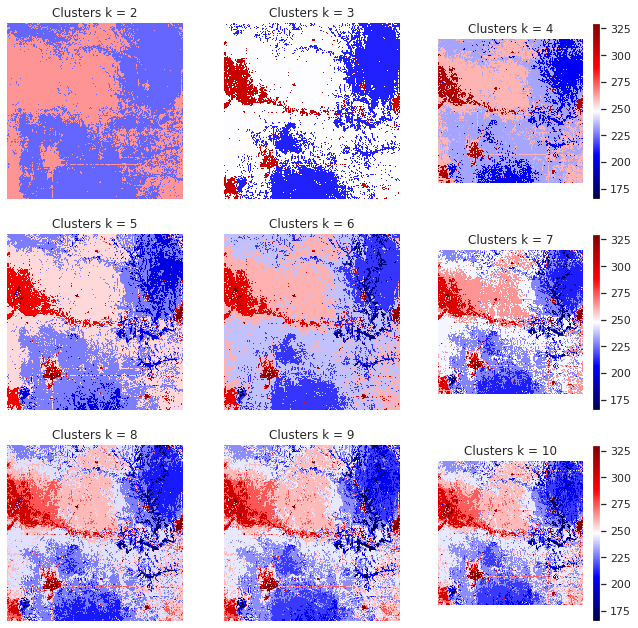

In [59]:
#### Show the Clusters for a timestep ####
from matplotlib import colors
tindex=7
fig=plt.figure(figsize=(11,11))
cccdir = '/home/tsw35/soteria/clubb/sgp_201745/'
for i in range(9):
    plt.subplot(3,3,i+1)
    fp = nc.Dataset(cccdir+'k_'+str(i+2)+'/clusters.nc','r')
    clust=fp['cluster'][tindex,:,:]
    mheat=[]
    H = fp['H'][tindex,:,:]
    nmax=np.max(clust)
    for j in range(int(nmax+1)):
        mheat.append(np.mean(fp['H'][tindex,:,:][clust==j]))
        clust[clust==j]=mheat[j]
    plt.imshow(clust,cmap='seismic',vmin=np.percentile(H,1),vmax=np.percentile(H,99))
    plt.grid(False)
    plt.axis('off')
    plt.title('Clusters k = '+str(i+2))
    if i in [2,5,8]:
        plt.colorbar()

<Figure size 432x288 with 0 Axes>

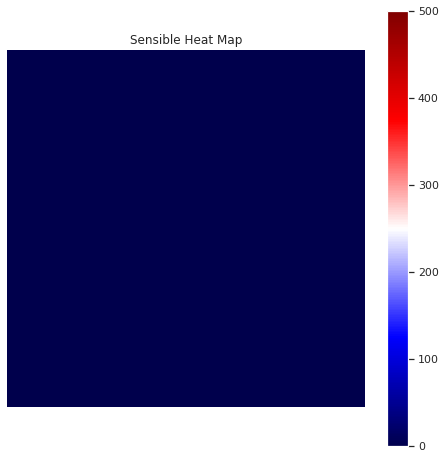

<Figure size 432x288 with 0 Axes>

In [32]:
tindex = 13
cccdir = '/home/tsw35/soteria/clubb/conv_0v2/'
plt.figure(figsize=(8,8))
fp = nc.Dataset(conv_dir+'k_1/clusters.nc','r')
plt.imshow(fp['H'][tindex,:,:],cmap='seismic',vmin=0,vmax=500)
plt.colorbar()
plt.title('Sensible Heat Map')
plt.grid(False)
plt.axis('off')
plt.figure()

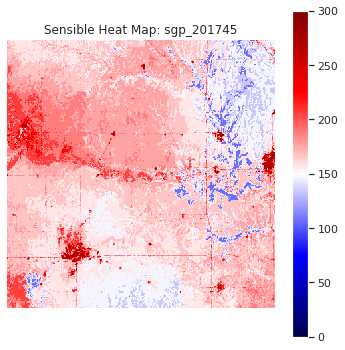

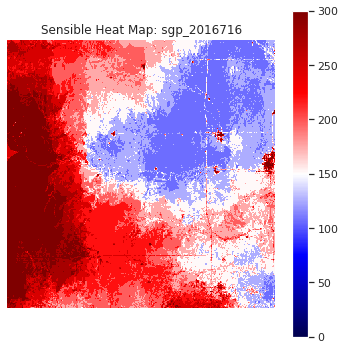

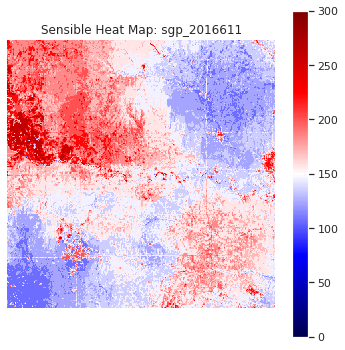

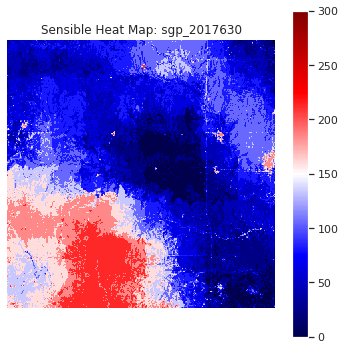

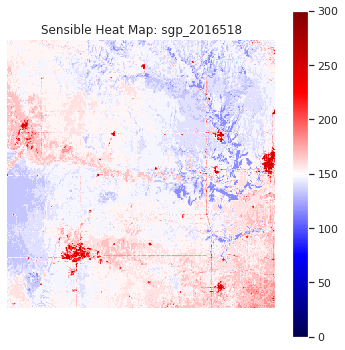

...

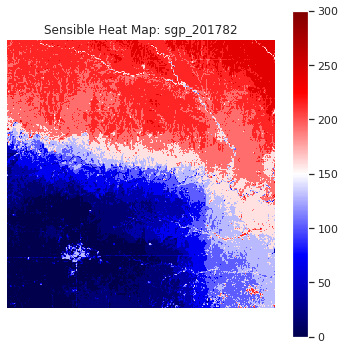

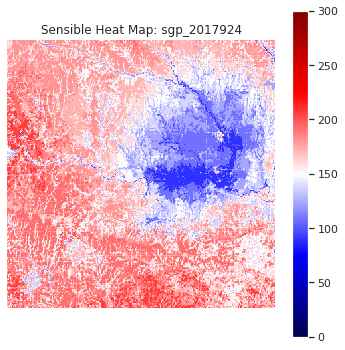

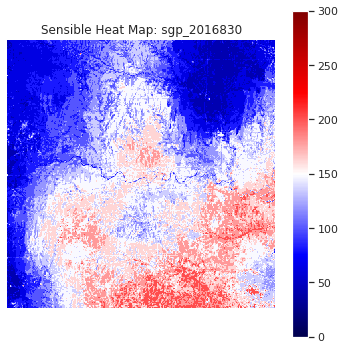

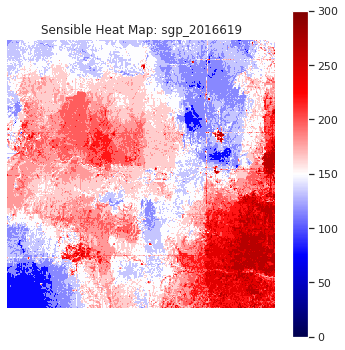

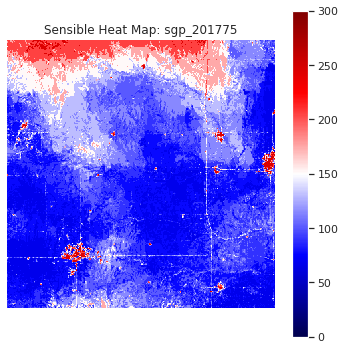

In [10]:
import warnings
ti = 500
warnings.filterwarnings('ignore')
for file in os.listdir(clubb_dir):
    try:
        fp1 = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(10)+'/clusters.nc','r')
        fp2 = nc.Dataset(clubb_dir+'/'+file+'/k_'+str(10)+'/clusters.nc','r')
    except:
        continue
    if 'sgp' not in file:
        continue
    plt.figure(figsize=(6,6))
    cccdir = '/home/tsw35/soteria/clubb/'+file+'/'
    fp = nc.Dataset(cccdir+'k_'+str(10)+'/clusters.nc','r')
    clust=fp['cluster'][:,:,:]
    mheat=[]
    H = fp['H'][:]
    H2 = H[np.mean(np.mean(H,axis=2),axis=1)>20,:,:]
    Hmask=np.zeros(clust.shape,dtype=bool)
    Hmask[(np.mean(np.mean(H,axis=2),axis=1)>20),:,:]=1
    nmax=np.max(clust)
    for j in range(int(nmax+1)):
        mheat.append(np.mean(fp['H'][:,:,:][(clust==j)&Hmask]))
        clust[clust==j]=mheat[j]
    clust=np.mean(clust[:],axis=0)
    plt.imshow(clust,cmap='seismic',vmin=0,vmax=300)
    plt.title('Sensible Heat Map: '+file)
    plt.grid(False)
    plt.axis('off')
    plt.colorbar()

<Figure size 432x288 with 0 Axes>

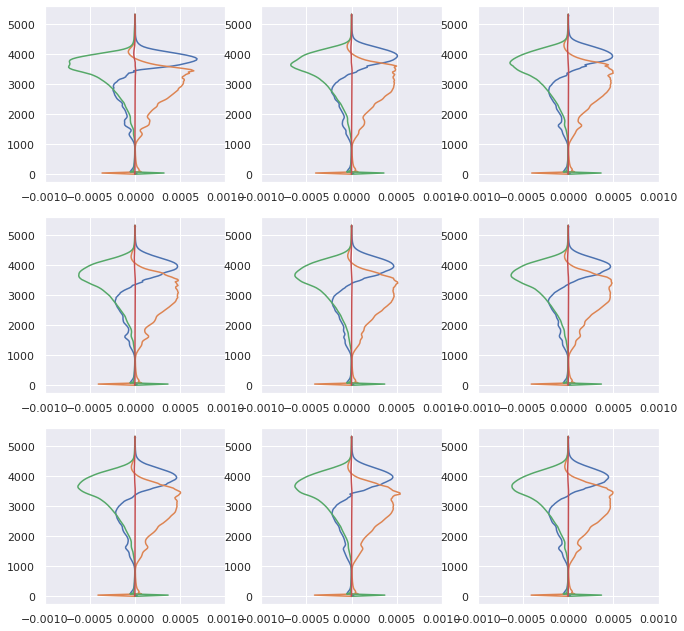

In [314]:
plt.figure()
tindex=7
fig=plt.figure(figsize=(11,11))
for i in range(9):
    plt.subplot(3,3,i+1)
    fp = nc.Dataset(conv_dir+'k_'+str(i+1)+'/agg_outzm.nc','r')
    alt      = fp['altitude'][:]
    thlp2_ta = np.mean(fp['thlp2_ta'][:,:,0,0],axis=0)
    thlp2_tp = np.mean(fp['thlp2_tp'][:,:,0,0],axis=0)
    thlp2_dp = np.mean(fp['thlp2_dp1'][:,:,0,0],axis=0)+np.mean(fp['thlp2_dp2'][:,:,0,0],axis=0)
    thlp2_ma = np.mean(fp['thlp2_ma'][:,:,0,0],axis=0)
    thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
    plt.plot(thlp2_ta,alt)
    plt.plot(thlp2_tp,alt)
    plt.plot(thlp2_dp,alt)
    plt.plot(thlp2_ma,alt)
    plt.xlim(-0.001,0.001)
    #plt.plot(thlp2_forcing,alt)
    #plt.legend(['Turbulent Adv.','Turbulent Prod.','Dissipation','Mean Adv.'])



In [5]:
sfc_dir   = '/stor/soteria/hydro/shared/sgp_surfaces/dx0100nx1000/'
with open(sfc_dir+'jsslatgrid_02','r') as fp:
    vect = np.array([float(i) for i in fp.readlines()])
vout = np.reshape(vect,(1000,1000))

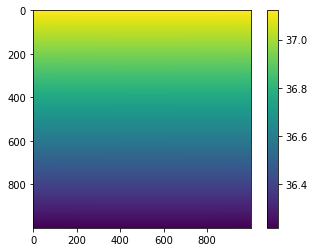

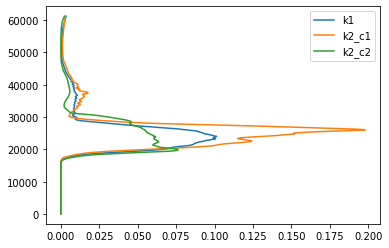

ustar
soil_heat_flux
veg_T_in_K
sfc_soil_T_in_K
deep_soil_T_in_K
lh
sh
cc
lwp
vwp
swp
iwp
rwp
z_cloud_base
z_inversion
precip_rate_sfc
rain_flux_sfc
rrm_sfc
precip_frac_tol
wpthlp_sfc
wprtp_sfc
upwp_sfc
vpwp_sfc
morr_snow_rate
thlm_vert_avg
rtm_vert_avg
um_vert_avg
vm_vert_avg
wp2_vert_avg
up2_vert_avg
vp2_vert_avg
rtp2_vert_avg
thlp2_vert_avg
T_sfc
rtm_spur_src
thlm_spur_src
rs_sd_morr_int


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

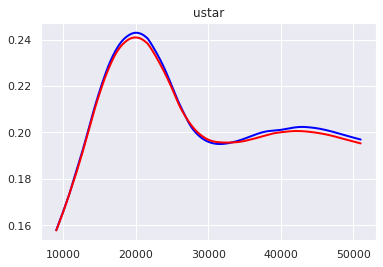

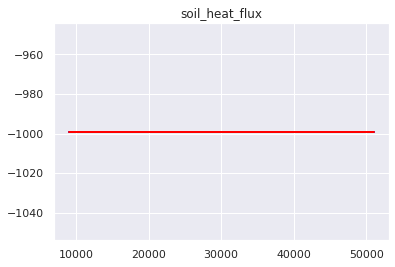

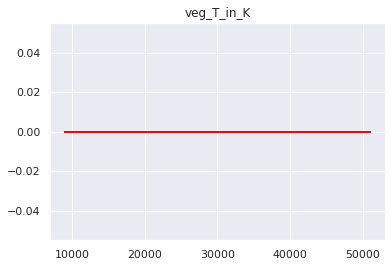

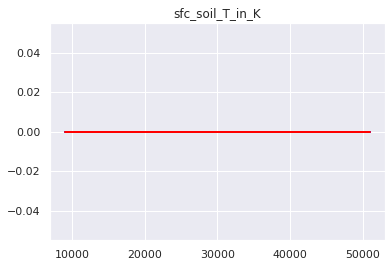

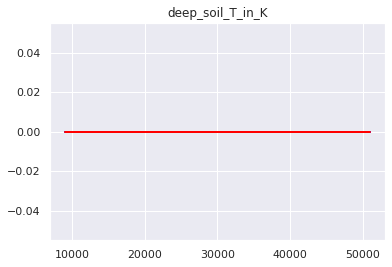

...

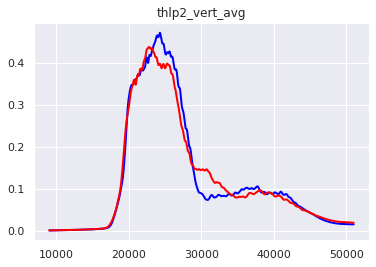

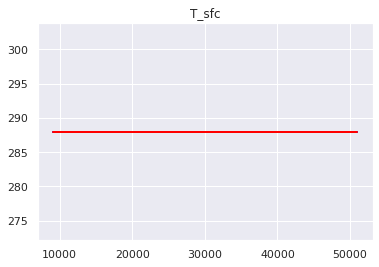

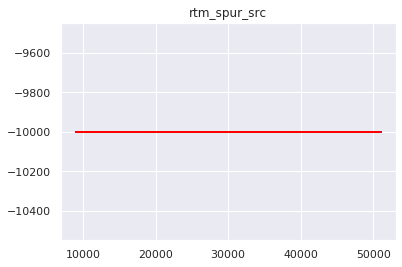

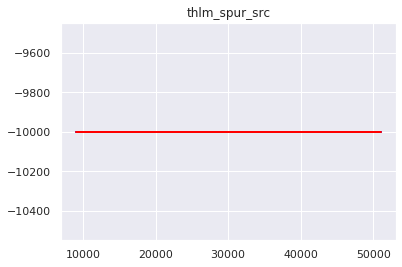

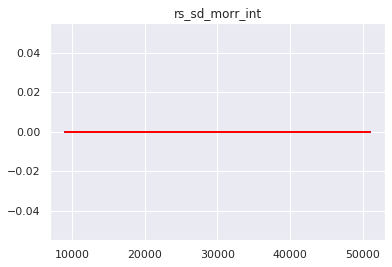

In [230]:
fp1 = nc.Dataset(clubb_dir+'/convi1c_0/k_1/agg_outsfc.nc','r')
fp2 = nc.Dataset(clubb_dir+'/convi1c_0/k_2/agg_outsfc.nc','r')
for f in fp1.variables:
    plt.figure()
    if f in ['altitude','longitude','latitude','time']:
        continue
    print(f)
    plt.plot(fp1['time'][s:e],fp1[f][s:e,0,0,0],color='blue',linewidth=2)
    plt.plot(fp2['time'][s:e],fp2[f][s:e,0,0,0],color='red',linewidth=2)
    plt.title(f)

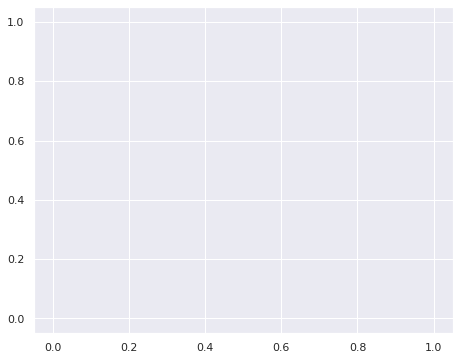

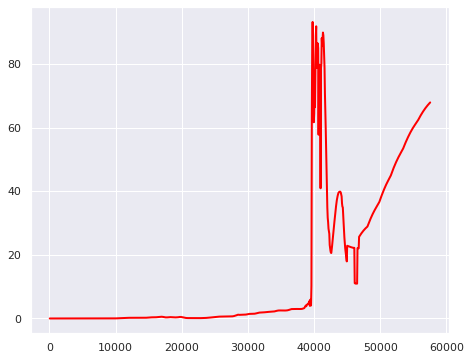

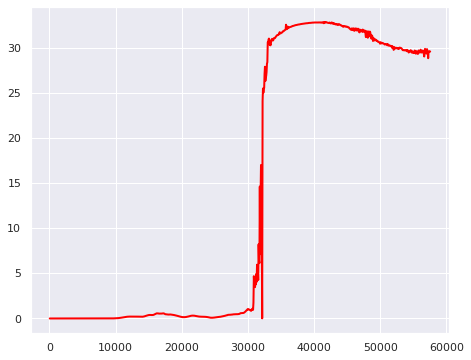

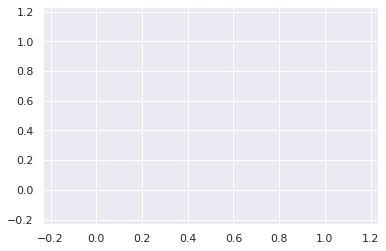

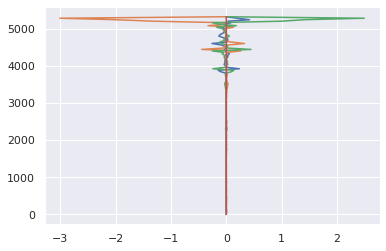

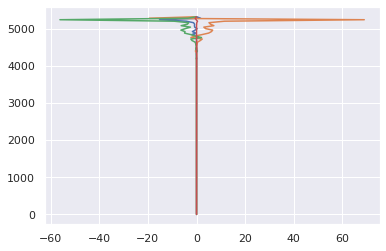

In [173]:
# Test SGP fix stuff
fp11sfc = nc.Dataset(clubb_dir+'/sgp_2016611test/k_1/c_1/output/arm_sfc.nc','r')
fp11zm  = nc.Dataset(clubb_dir+'/sgp_2016611test/k_1/c_1/output/arm_zm.nc','r')
fp21sfc = nc.Dataset(clubb_dir+'/sgp_2016611test/k_2/c_1/output/arm_sfc.nc','r')
fp21zm  = nc.Dataset(clubb_dir+'/sgp_2016611test/k_2/c_1/output/arm_zm.nc','r')
fp22sfc = nc.Dataset(clubb_dir+'/sgp_2016611test/k_2/c_2/output/arm_sfc.nc','r')
fp22zm  = nc.Dataset(clubb_dir+'/sgp_2016611test/k_2/c_2/output/arm_zm.nc','r')

sfcs = [fp11sfc, fp21sfc,fp22sfc]
zms  = [fp11zm,fp21zm,fp22zm]
s=0
e=-1
for fp in sfcs:
    plt.figure(figsize=(7.5,6))
    plt.plot(fp['time'][s:e],fp['lwp'][s:e,0,0,0],color='red',linewidth=2)

for fp in zms:
    plt.figure()
    alt      = fp['altitude'][:]
    thlp2_ta = np.mean(fp['thlp2_ta'][:,:,0,0],axis=0)
    thlp2_tp = np.mean(fp['thlp2_tp'][:,:,0,0],axis=0)
    thlp2_dp = np.mean(fp['thlp2_dp1'][:,:,0,0],axis=0)+np.mean(fp['thlp2_dp2'][:,:,0,0],axis=0)
    thlp2_ma = np.mean(fp['thlp2_ma'][:,:,0,0],axis=0)
    thlp2_forcing = np.mean(fp['thlp2_forcing'][:,:,0,0],axis=0)
    plt.plot(thlp2_ta,alt)
    plt.plot(thlp2_tp,alt)
    plt.plot(thlp2_dp,alt)
    plt.plot(thlp2_ma,alt)

ustar
soil_heat_flux
veg_T_in_K
sfc_soil_T_in_K
deep_soil_T_in_K
lh
sh
cc
lwp
vwp
swp
iwp
rwp
z_cloud_base
z_inversion
precip_rate_sfc
rain_flux_sfc
rrm_sfc
precip_frac_tol
wpthlp_sfc
wprtp_sfc
upwp_sfc
vpwp_sfc
morr_snow_rate
thlm_vert_avg
rtm_vert_avg
um_vert_avg
vm_vert_avg
wp2_vert_avg
up2_vert_avg
vp2_vert_avg
rtp2_vert_avg
thlp2_vert_avg
T_sfc
rtm_spur_src
thlm_spur_src
rs_sd_morr_int


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

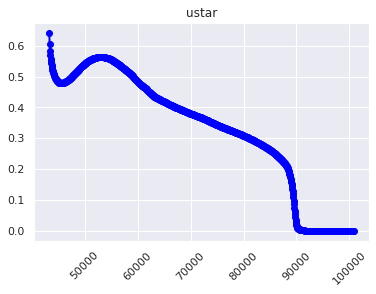

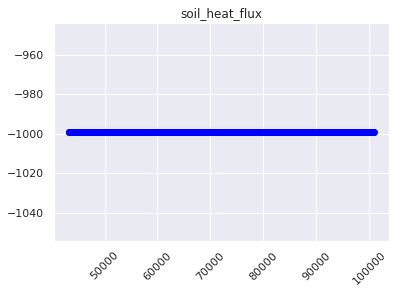

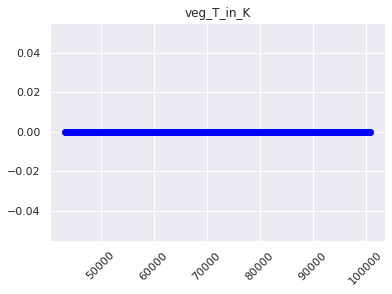

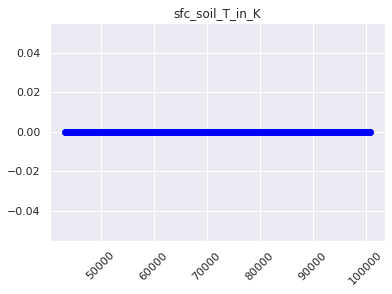

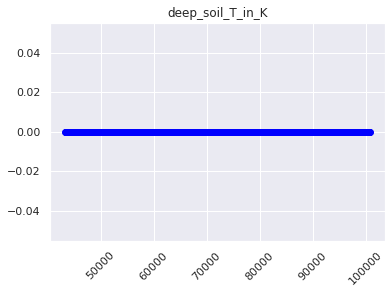

...

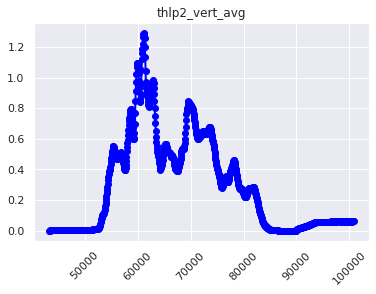

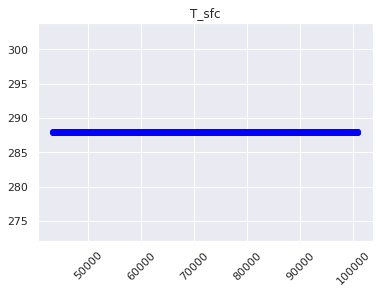

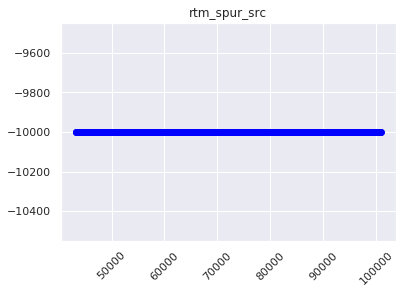

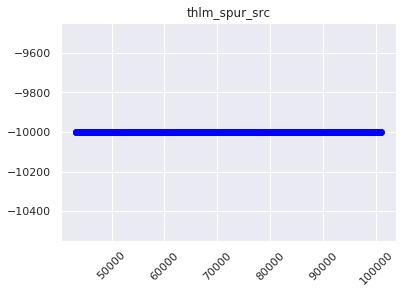

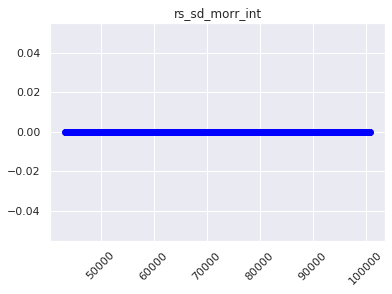

In [243]:
fp1 = nc.Dataset(clubb_dir+'/sgp_2016611test/k_1/c_1/output/arm_sfc.nc','r')
fp11zm  = nc.Dataset(clubb_dir+'/sgp_2016611test/k_1/c_1/output/arm_zm.nc','r')
s = 700
s=0
e = -1
for f in fp1.variables:
    plt.figure()
    if f in ['altitude','longitude','latitude','time']:
        continue
    print(f)
    ax = plt.gca()
    ax.plot(fp1['time'][s:e]+43260,fp1[f][s:e,0,0,0],'-o',color='blue',linewidth=2)
    #ax.set_xticks(fp1['time'][s:e]+43260)
    #ax.set_yscale('log')
    plt.title(f)
    plt.xticks(rotation=45)

wp2
rtp2
thlp2
rtpthlp
wprtp
wpthlp
wp2up2
wp2vp2
wp4
up2
vp2
Skw_zm
Skthl_zm
Skrt_zm
wpthvp
rtpthvp
thlpthvp
tau_zm
Kh_zm
wprcp
rc_coef_zm
wm_zm
thlprcp
rtprcp
rcp2
upwp
vpwp
upthlp
uprtp
vpthlp
vprtp
upthvp
uprcp
vpthvp
vprcp
rho_zm
sigma_sqd_w
Skw_velocity
gamma_Skw_fnc
coef_wp4_implicit
C6rt_Skw_fnc
C6thl_Skw_fnc
C7_Skw_fnc
C1_Skw_fnc
a3_coef
wp3_on_wp2
rcm_zm
rtm_zm
thlm_zm
cloud_frac_zm
ice_supersat_frac_zm
rho_ds_zm
thv_ds_zm
em
mean_w_up
mean_w_down
shear
wp3_zm
thlp3_zm
rtp3_zm
w_1_zm
w_2_zm
varnce_w_1_zm
varnce_w_2_zm
mixt_frac_zm
Frad
Frad_LW
Frad_SW
Frad_LW_up
Frad_SW_up
Frad_LW_down
Frad_SW_down
Fprec
Fcsed
Vri
VNi
Vrc
VNc
Vrr
VNr
Vrs
VNs
Vrg
Vrrprrp
VNrpNrp
Vrrprrp_expcalc
VNrpNrp_expcalc
wp2_bt
wp2_ma
wp2_ta
wp2_ac
wp2_bp
wp2_pr1
wp2_pr2
wp2_pr3
wp2_dp1
wp2_dp2
wp2_sdmp
wp2_cl
wp2_pd
wp2_sf
wp2_splat
vp2_bt
vp2_ma
vp2_ta
vp2_tp
vp2_dp1
vp2_dp2
vp2_pr1
vp2_pr2
vp2_sdmp
vp2_cl
vp2_pd
vp2_sf
vp2_splat
up2_bt
up2_ma
up2_ta
up2_tp
up2_dp1
up2_dp2
up2_pr1
up2_pr2
up2_sdmp
up2_

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

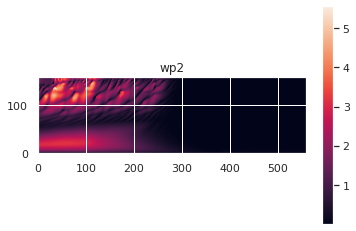

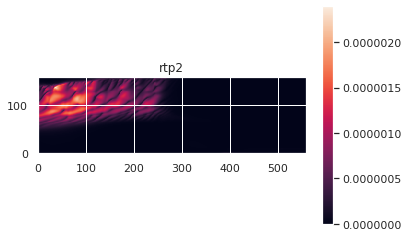

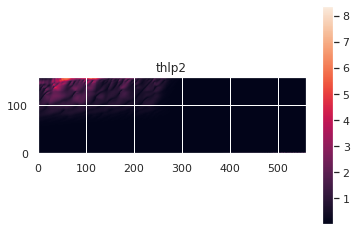

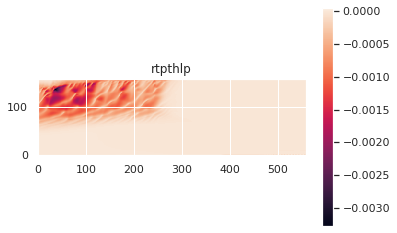

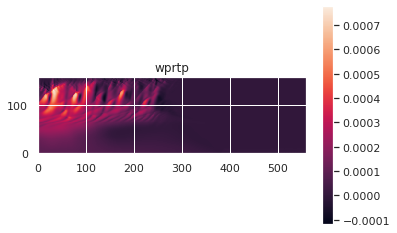

...

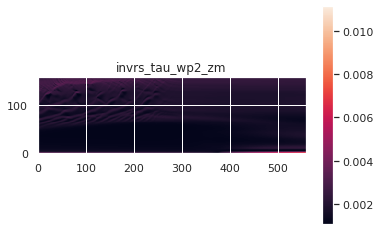

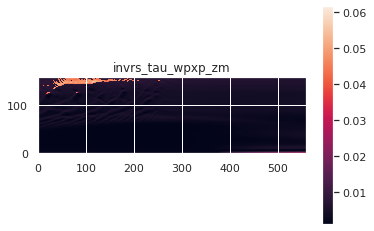

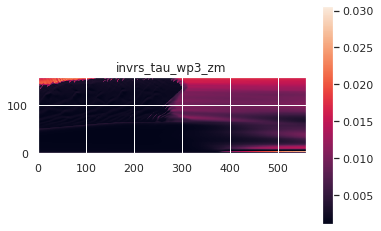

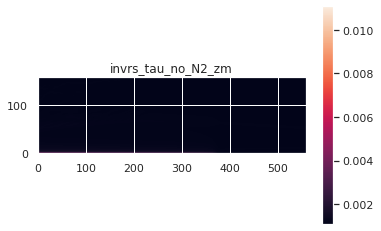

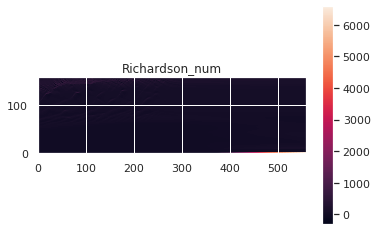

In [244]:
fp1  = nc.Dataset(clubb_dir+'/sgp_2016611test/k_1/c_1/output/arm_zm.nc','r')
for f in fp1.variables:
    plt.figure()
    if f in ['altitude','longitude','latitude','time']:
        continue
    print(f)
    plt.imshow(np.transpose(fp1[f][400:-1,:,0,0]),origin='lower')
    plt.colorbar()
    plt.title(f)

In [ ]:
fp

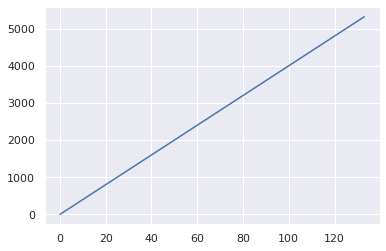

In [210]:
plt.plot(fp1['altitude'][:])

17
Press[Pa]
T_f[K\s]
rtm_f[kg\kg\s]
um_ref[m\s]
vm_ref[m\s]
um_f[m\s^2]
vm_f[m\s^2]
omega[Pa\s]
ug[m\s]
vg[m\s]



/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


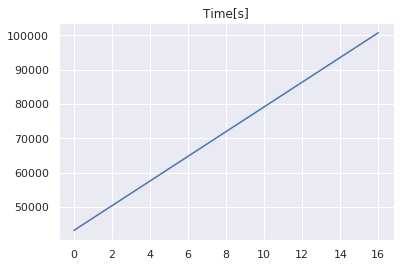

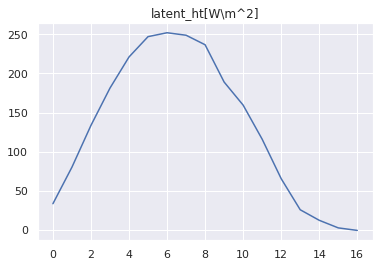

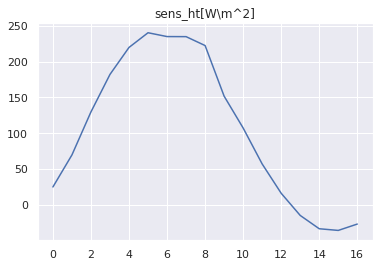

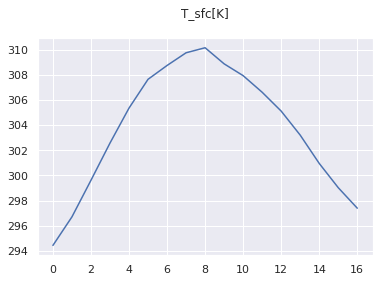

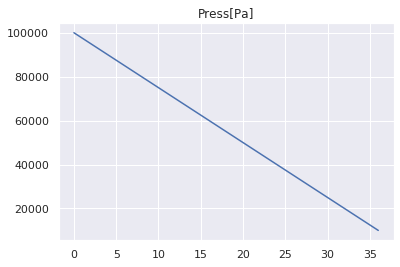

...

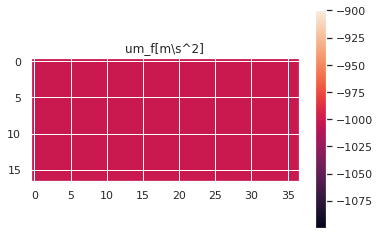

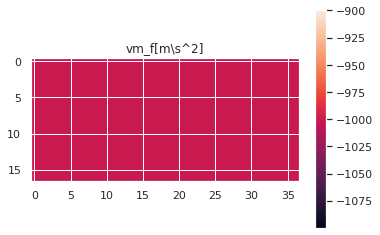

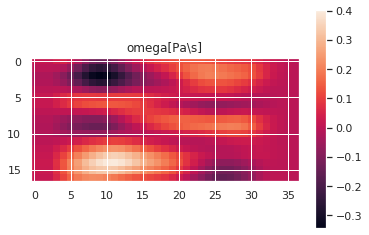

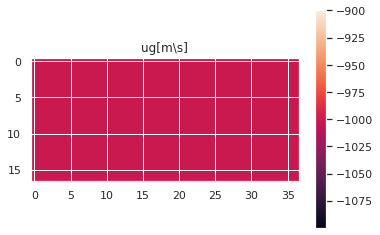

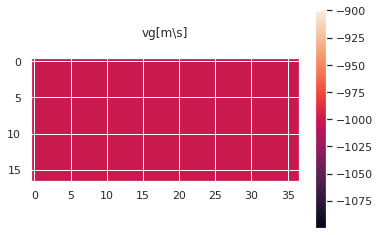

In [6]:
errordir='/home/tsw35/soteria/clubb/sgp_2016611/k_1/c_1/input/case_setups'
datasfc = read_arm(errordir+'/arm_sfc.in')
datasnd = read_arm(errordir+'/arm_sounding.in')
datafor = read_forcings(errordir+'/arm_forcings.in')

for d in datasfc.keys():
    plt.figure()
    plt.plot(datasfc[d])
    plt.title(d)
for d in datasnd.keys():
    plt.figure()
    plt.title(d)
    plt.plot(datasnd[d])
for d in datafor.keys():
    if d == 'time':
        continue
    print(d)
    plt.figure()
    plt.title(d)
    plt.imshow(datafor[d])
    plt.colorbar()
    

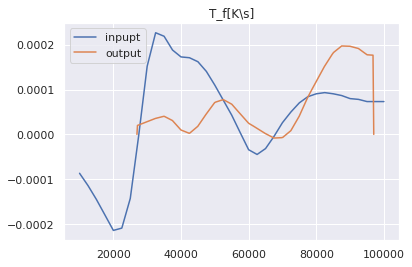

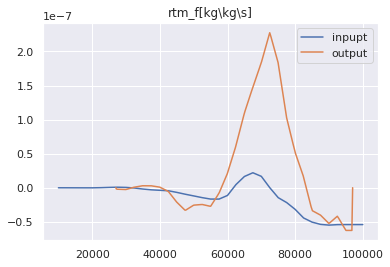

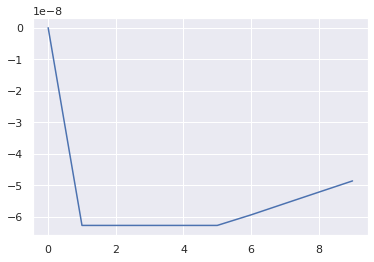

In [47]:
fp = nc.Dataset('/home/tsw35/soteria/clubb/sgp_2016611/k_1/c_1/output/arm_zt.nc')
for d in datafor.keys():
    if d[0]=='T':
        data2 = fp['thlm_forcing'][8*60,:,0,0]
    elif d[0:4] == 'rtm_':
        data2 = fp['rtm_forcing'][8*60,:,0,0]
    else:
        continue
    data = datafor[d][8,:]
    pres1 = datafor['Press[Pa]'][8,:]
    pres2 = fp['p_in_Pa'][8*60,:,0,0]
    plt.figure()
    plt.plot(pres1,data)
    plt.plot(pres2,data2)
    plt.title(d)
    plt.legend(['inpupt','output'])
d = 'rtm_f[kg\kg\s]'
d= 'ug[m\s]'
datafor[d].shape
data2.shape
plt.figure()
plt.plot(data2[0:10])

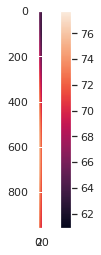

In [51]:
plt.imshow(fp['T_in_K'][:,0:25,0,0]-np.min(fp['T_in_K'][:,:,0,0]))
plt.colorbar()

In [31]:
for file in os.listdir(clubb_dir):
    errordir = clubb_dir+'/'+file+'/k_1/c_1/input/case_setups'
    if 'sgp' not in file:
        continue
    try:
        datafor = read_forcings(errordir+'/arm_forcings.in')
    except:
        continue
    title=file
    if file in badfiles:
        title='*****'+file+'*****'
    d = 'rtm_f[kg\kg\s]'
    plt.figure()
    plt.title(title)
    plt.imshow(datafor[d],vmin=-4*10**-7,vmax=4*10**-7,cmap='terrain')
    plt.colorbar()

17


NameError: name 'badfiles' is not defined

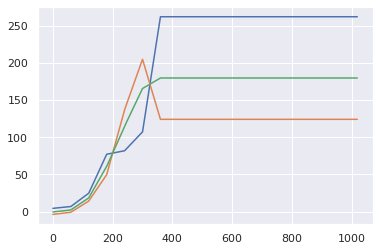

In [236]:
fpa = nc.Dataset(clubb_dir+'/conv_100/k_2/c_2/output/arm_sfc.nc')
fpb = nc.Dataset(clubb_dir+'/conv_100/k_2/c_1/output/arm_sfc.nc')
fpc = nc.Dataset(clubb_dir+'/conv_100/k_2/agg_outsfc.nc')
plt.plot(fpa['sh'][:,0,0,0])
plt.plot(fpb['sh'][:,0,0,0])
plt.plot(fpc['sh'][:,0,0,0])

In [2]:
def read_forcings(path):
    fp = open(path,'r')
    lines=fp.readlines()
    # determine number of timesteps first 
    t = 0
    for line in lines:
        if line[0]=='!':
            continue
        lsp = line.split(' ')
        if (lsp[1]=='37') or (lsp[1]=='37\n'):
            t = t+1
    print(t)
    data={}
    headbool=True
    ti = -1
    alt = 0
    for line in lines:
        if line[0]=='!':
            continue
        if headbool:
            headbool = False
            lsp = line.split(' ')
            head = [x for x in lsp if x != '']
            n = len(head)
            for x in head:
                data[x]=np.zeros((t,37))
            data['time']=[]
            continue
        lsp = line.split(' ')
        if (lsp[1]=='37') or (lsp[1]=='37\n'):
            data['time'].append(float(lsp[0]))
            ti=ti+1
            alt=0
            continue
        for i in range(n):
            x = head[i]
            data[x][ti,alt]=float(lsp[i])
        alt=alt+1
    data['time']=np.array(data['time'])
    return data
def read_arm(path):
    # works on sfc or sounding
    fp = open(path,'r')
    lines=fp.readlines()
    headbool=True
    data = {}
    for line in lines:
        if line[0]=='!':
            continue
        lsp = line.split(' ')
        if headbool:
            head = [x for x in lsp if x != '']
            headbool = False
            for x in head:
                data[x]=[]
            continue
        for i in range(len(head)):
            x = head[i]
            data[x].append(float(lsp[i]))
    for x in data.keys():
        data[x]=np.array(data[x])
    return data

In [184]:
a = "a.   b.   c d.  d"
b=a.split(' ')
print(b)
b.remove('')
print(b)

['a.', '', '', 'b.', '', '', 'c', 'd.', '', 'd']
['a.', '', 'b.', '', '', 'c', 'd.', '', 'd']
